In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory



# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

Directories
/kaggle/input/cassava-leaf-disease-classification/sample_submission.csv
/kaggle/input/cassava-leaf-disease-classification/label_num_to_disease_map.json
/kaggle/input/cassava-leaf-disease-classification/train.csv
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train14-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train13-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train04-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train01-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train08-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train00-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train10-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train02-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train15-1327.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train03-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train11-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train12-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train06-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train09-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train07-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train05-1338.tfrec
/kaggle/input/cassava-leaf-disease-classification/test_tfrecords/ld_test00-1.tfrec

In [3]:
#
!nvidia-smi

Thu Aug  8 17:26:16 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   36C    P0             25W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

* # Machine learning steps to approach this promlem
* **1.Prepare Data**
*   (i).Importing data
*   (ii).Explore and Wrangle data
*   (iii).Splting data 
*  **2.Builing the model**
*   (i).Baseline model
*   (ii)model iteration
*   (iii)Model Evaluation
*  **3.Comminicating results**

* **# 1.Prepare Data 
* (i).Importing data**

In [4]:
import warnings
warnings.filterwarnings("ignore")  # Ignores all warnings

In [5]:
#module and libary importation
import os
import json
import pandas as pd
import matplotlib as plt
import plotly.express as px

In [6]:
# input data and list number of files
for dirpath, dirnames, filenames in os.walk('../input'):
    
    print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

There are 3 directories and 0 images in '../input'.
There are 1 directories and 0 images in '../input/cassava_model'.
There are 1 directories and 0 images in '../input/cassava_model/tensorflow2'.
There are 1 directories and 0 images in '../input/cassava_model/tensorflow2/default'.
There are 0 directories and 1 images in '../input/cassava_model/tensorflow2/default/1'.
There are 1 directories and 0 images in '../input/resnet-50'.
There are 1 directories and 0 images in '../input/resnet-50/tensorflow2'.
There are 1 directories and 0 images in '../input/resnet-50/tensorflow2/classification'.
There are 1 directories and 1 images in '../input/resnet-50/tensorflow2/classification/1'.
There are 0 directories and 2 images in '../input/resnet-50/tensorflow2/classification/1/variables'.
There are 4 directories and 3 images in '../input/cassava-leaf-disease-classification'.
There are 0 directories and 16 images in '../input/cassava-leaf-disease-classification/train_tfrecords'.
There are 0 director

In [7]:
os.listdir('../input/cassava_model/tensorflow2/default/1/')

['model.h5']

In [4]:
#os.listdir('/kaggle/input/cassava-leaf-disease-classification/train_tfrecords/ld_train14-1338.tfrec')

In [7]:
import json

# path to  JSON file
file_path = '/kaggle/input/cassava-leaf-disease-classification/label_num_to_disease_map.json'

# Read the JSON data
with open(file_path) as f:
    label_map = json.load(f)

# Convert keys to integers (if needed)
label_map = {int(k): v for k, v in label_map.items()}

# Now you can use the 'label_map' dictionary to map disease codes to their corresponding names
print(label_map)

{0: 'Cassava Bacterial Blight (CBB)', 1: 'Cassava Brown Streak Disease (CBSD)', 2: 'Cassava Green Mottle (CGM)', 3: 'Cassava Mosaic Disease (CMD)', 4: 'Healthy'}


In [9]:
df=pd.read_csv("/kaggle/input/cassava-leaf-disease-classification/train.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21397 entries, 0 to 21396
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image_id  21397 non-null  object
 1   label     21397 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 334.5+ KB


In [26]:
df.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


In [9]:
#module importation
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import pandas as pd
import random

In [30]:
file=pd.read_csv("/kaggle/input/cassava-leaf-disease-classification/train.csv")
file.shape[0]

21397

In [31]:
#cheaking for any mising label
len(os.listdir('/kaggle/input/cassava-leaf-disease-classification/train_images'))==file.shape[0]

True

In [32]:
file.head(10)

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3
5,1000837476.jpg,3
6,1000910826.jpg,2
7,1001320321.jpg,0
8,1001723730.jpg,4
9,1001742395.jpg,3


In [33]:
file["label"].value_counts()

label
3    13158
4     2577
2     2386
1     2189
0     1087
Name: count, dtype: int64

**image data loookup****

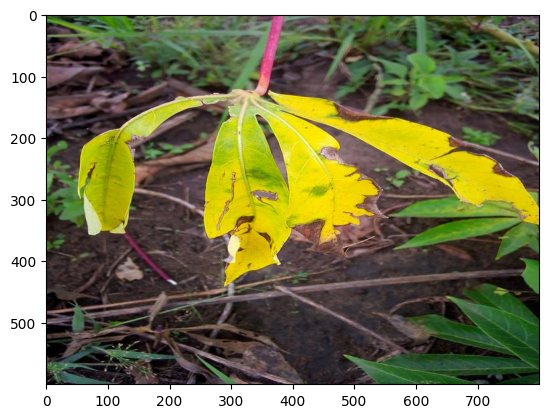

In [34]:
img=mpimg.imread('/kaggle/input/cassava-leaf-disease-classification/train_images/1001723730.jpg')
plt.imshow(img)

In [35]:
img.shape

(600, 800, 3)

In [19]:
type(img)

numpy.ndarray

In [37]:
#Cheaking number of color channels
img.ndim

3

In [23]:
label_map

{0: 'Cassava Bacterial Blight (CBB)',
 1: 'Cassava Brown Streak Disease (CBSD)',
 2: 'Cassava Green Mottle (CGM)',
 3: 'Cassava Mosaic Disease (CMD)',
 4: 'Healthy'}

In [24]:
#for loop to get the real names  of the diseases and append them on the df
name=[]
for num in df["label"]:
    if num==0:
        name.append("Bacterial Blight")
    elif num==1 :
        name.append("Brown Streak")
    elif num==2 :
        name.append("Green Mottle")
    elif num==3 :
        name.append("Mosaic")
    elif num==4 :
        name.append("Healthy")
#  adding another column in the database
df["full_name"]=name
df.head()

,image_id,label,full_name
0,1000015157.jpg,0,Bacterial Blight
1,1000201771.jpg,3,Mosaic
2,100042118.jpg,1,Brown Streak
3,1000723321.jpg,1,Brown Streak
4,1000812911.jpg,3,Mosaic


In [21]:
"""count_value=df["full_name"].value_counts(ascending=True,normalize=True)
count_value.plot(kind="bar",
                 title="Number of iamges of diseases in our dataset "
                )"""

'count_value=df["full_name"].value_counts(ascending=True,normalize=True)\ncount_value.plot(kind="bar",\n                 title="Number of iamges of diseases in our dataset "\n                )'

In [40]:
count_value=df["full_name"].value_counts(ascending=True,normalize=True)
px.bar(count_value,
      width=600,
      height=600,
      color=count_value,
      title="A barplot of the number of image in our data set for every disease")

In [23]:
os.listdir('/kaggle/input/cassava-leaf-disease-classification/train_images')[1025]

'2633999116.jpg'

In [41]:
df["full_name"].unique()

array(['Bacterial Blight', 'Mosaic', 'Brown Streak', 'Green Mottle',
       'Healthy'], dtype=object)

In [39]:
#divide all the data into subfolder cointing images for each dieseases
Bacterial_Blight=df[df["full_name"]=="Bacterial Blight"]
Mosaic=df[df["full_name"]=="Mosaic"]
Brown_Streak=df[df["full_name"]=="Brown Streak"]
Green_Mottle=df[df["full_name"]=="Green Mottle"]
Healthy=df[df["full_name"]=="Healthy"]
#[Healthy.head(),Mosaic.head(),Brown_Streak.head(),Green_Mottle.head(),Bacterial_Blight.head()]


In [15]:
#set for separating data into train and test for each class
import os
import shutil
import pandas as pd
from sklearn.model_selection import train_test_split

In [12]:
image_dir='/kaggle/input/cassava-leaf-disease-classification/train_images'#path source folder which is read only

output_dir='/kaggle/myspace/cassava_leaf_disease_classification'#path to my workspace that have i have created so that i have read and write permission

In [11]:
# Getting unique labels
unique_labels = df['full_name'].unique()
unique_labels

array(['Bacterial Blight', 'Mosaic', 'Brown Streak', 'Green Mottle',
       'Healthy'], dtype=object)

In [13]:
%%timeit
# Create training and validation directories for each unique label in the writable directory
for labels in unique_labels:
    train_label_dir=os.path.join(output_dir,"train",str(labels))
    val_label_dir=os.path.join(output_dir,"val",str(labels))
    os.makedirs(train_label_dir,exist_ok=True)
    os.makedirs(val_label_dir,exist_ok=True)

183 µs ± 1.75 µs per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


In [16]:
# Split the data into training and validation sets (80% training, 20% validation)
for lables in unique_labels:
    lables_images=df[df['full_name']==lables]['image_id'].tolist()
    train_images,val_images=train_test_split(lables_images,test_size=.2,random_state=42)
    #print(f'The original size was {len(lables_images)} after spliting it is now {len(train_images)}')
    
    # coping training images
    for images in train_images:
        src_path=os.path.join(image_dir,images)
        dst_path=os.path.join(output_dir,'train',str(lables),images)
        if os.path.exists(src_path):
            shutil.copy(src_path,dst_path)
    #coping the validation data
    for images in val_images:
        src_path=os.path.join(image_dir,images)
        dst_path=os.path.join(output_dir,'val',str(lables),images)
        if os.path.exists(src_path):
            shutil.copy(src_path,dst_path)
        
print("Images have been separated into tarining and validation set and directories created")    

Images have been separated into tarining and validation set and directories created


In [13]:
df.shape

(21397, 3)

In [36]:
#let walk thougth the directories 
# input data and list number of files
for dirpath, dirnames, filenames in os.walk(output_dir):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

There are 2 directories and 0 images in '/kaggle/myspace/cassava_leaf_disease_classification'.
There are 5 directories and 0 images in '/kaggle/myspace/cassava_leaf_disease_classification/train'.
There are 0 directories and 10526 images in '/kaggle/myspace/cassava_leaf_disease_classification/train/Mosaic'.
There are 0 directories and 869 images in '/kaggle/myspace/cassava_leaf_disease_classification/train/Bacterial Blight'.
There are 0 directories and 1908 images in '/kaggle/myspace/cassava_leaf_disease_classification/train/Green Mottle'.
There are 0 directories and 2061 images in '/kaggle/myspace/cassava_leaf_disease_classification/train/Healthy'.
There are 0 directories and 1751 images in '/kaggle/myspace/cassava_leaf_disease_classification/train/Brown Streak'.
There are 5 directories and 0 images in '/kaggle/myspace/cassava_leaf_disease_classification/val'.
There are 0 directories and 2632 images in '/kaggle/myspace/cassava_leaf_disease_classification/val/Mosaic'.
There are 0 direct

In [40]:
#Cheaking if all images are there
Mosaic.shape[0]==len(os.listdir('/kaggle/myspace/cassava_leaf_disease_classification/val/Mosaic'))+len(os.listdir('/kaggle/myspace/cassava_leaf_disease_classification/train/Mosaic'))

True

In [48]:
def view_images(target_class): 
    row=4
    col=4
    fig=plt.figure(figsize=(13,7))
    for i in range(1,row*col):

        fig=plt.subplot(row,col,i)
        target_dir='/kaggle/myspace/cassava_leaf_disease_classification/train/'
        #target_class='Mosaic'
        t_folder=target_dir+target_class
        r_num=random.sample(os.listdir(t_folder),1)
        img=mpimg.imread(t_folder+'/'+r_num[0])
        plt.imshow(img,)
        plt.title(target_class,)
        plt.axis('off') 
        plt.grid(False)
    plt.tight_layout()
    plt.show()
      


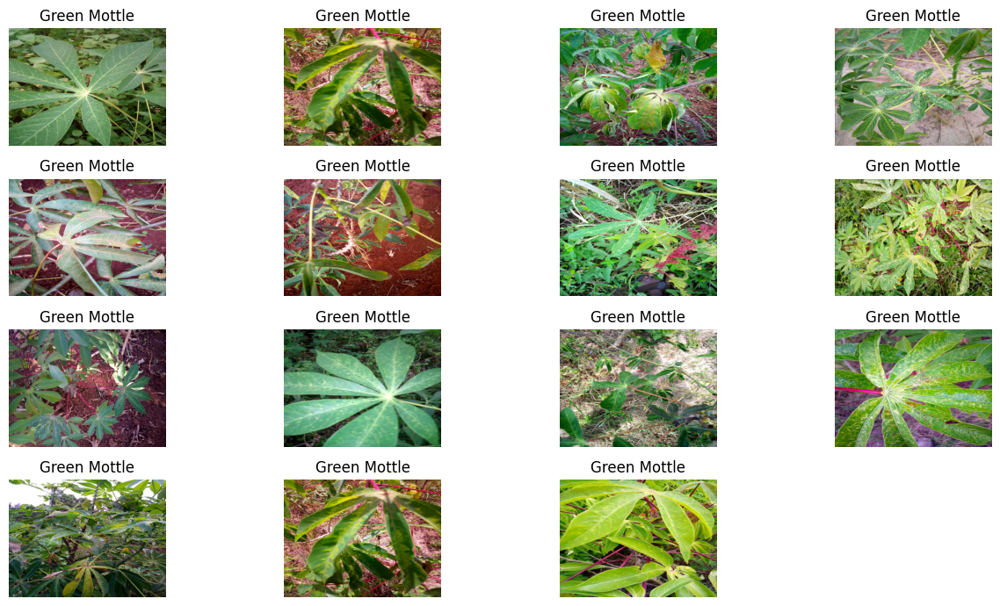

In [49]:
view_images("Green Mottle")

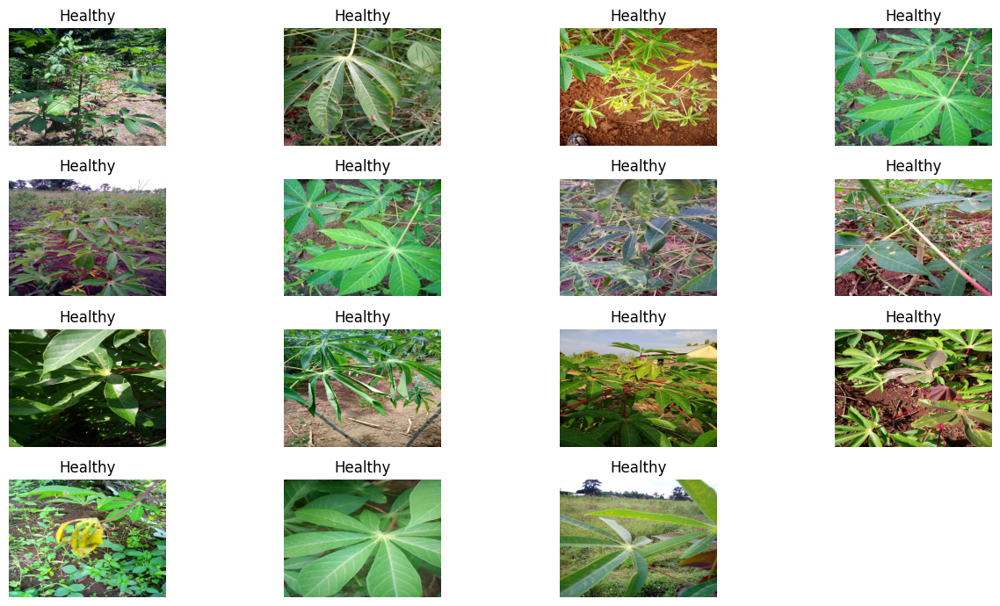

In [51]:
view_images("Healthy")

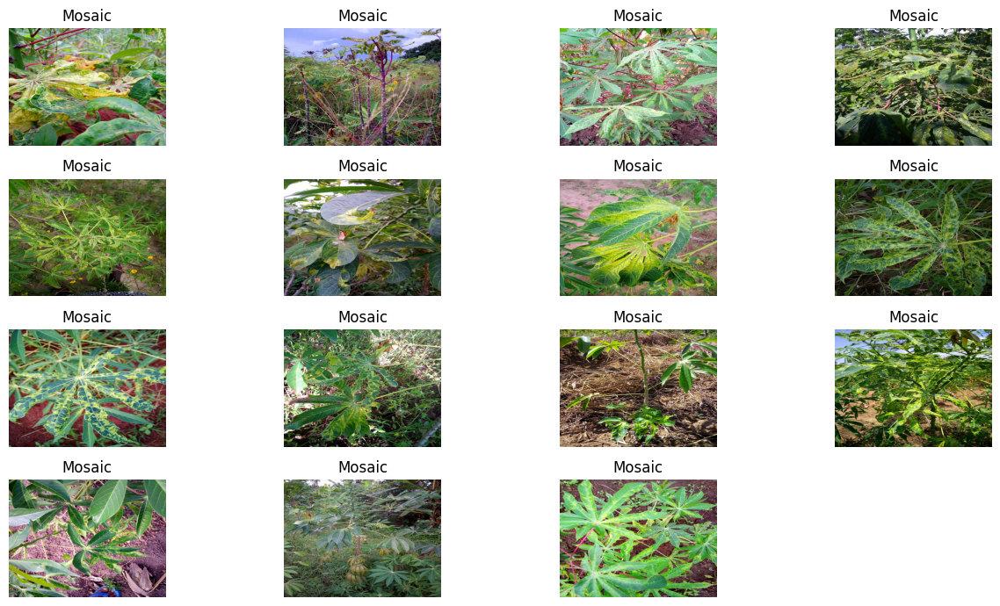

In [52]:
view_images("Mosaic")

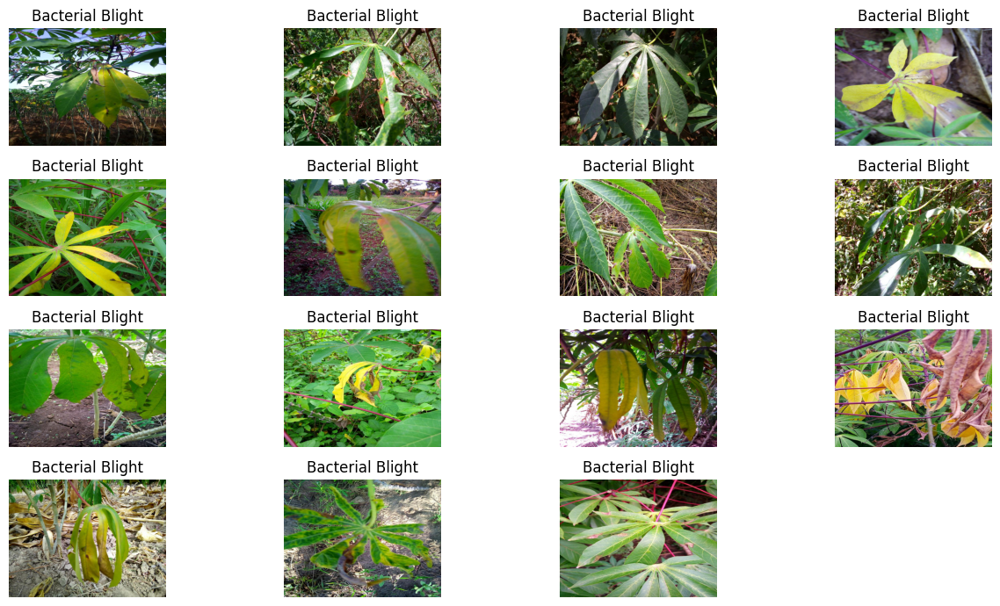

In [53]:
view_images("Bacterial Blight")

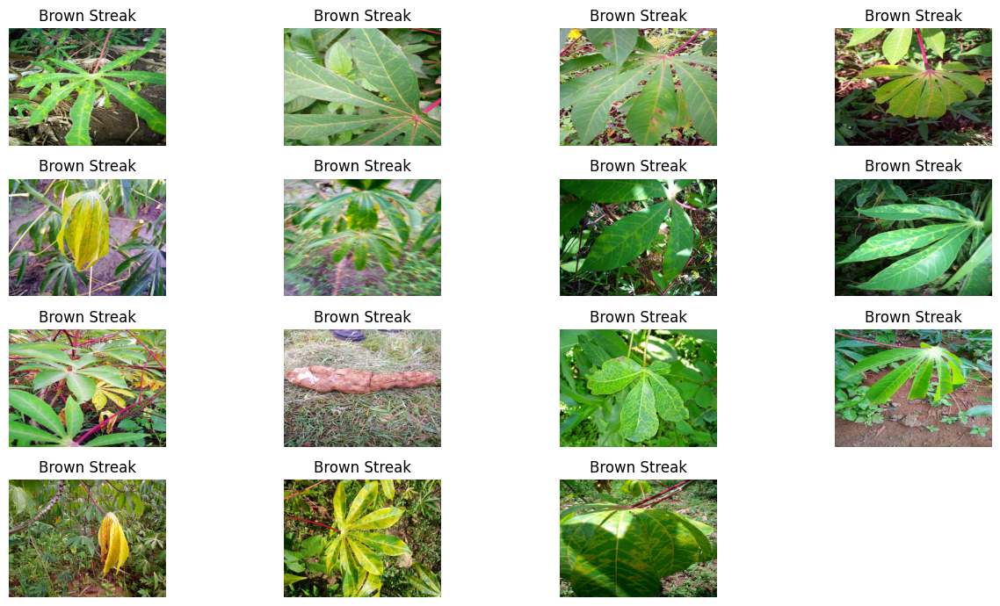

In [54]:
view_images("Brown Streak")

# **Model building**

# **(i)Building model from scratch**

In [57]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator


data prep

In [58]:

#Data preperation for the model
train_dir='/kaggle/myspace/cassava_leaf_disease_classification/train'
val_dir='/kaggle/myspace/cassava_leaf_disease_classification/val'
train_data_gen=ImageDataGenerator(1/255)
val_data_gen=ImageDataGenerator(1/255)

train_data=train_data_gen.flow_from_directory(train_dir,
                                              target_size=(224,224),
                                              color_mode='rgb',
                                              class_mode="categorical",
                                              batch_size=32,
                                              shuffle=True,
                                             )
val_data=train_data_gen.flow_from_directory(val_dir,
                                              target_size=(224,224),
                                              color_mode='rgb',
                                              class_mode="categorical",
                                              batch_size=32,
                                              shuffle=False,
                                             )
# Debugging to check lengths
print(f"Number of training batches: {len(train_data)}")
print(f"Number of validation batches: {len(val_data)}")

Found 17115 images belonging to 5 classes.
Found 4282 images belonging to 5 classes.
Number of training batches: 535
Number of validation batches: 134


In [59]:
"""#model building
model0=tf.keras.Sequential([
    tf.keras.layers.Conv2D(32,(3,3),activation="relu",input_shape=(224,224,3)),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3),activation="relu"),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3),activation="relu"),
    tf.keras.layers.MaxPool2D(2,2),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128),
    tf.keras.layers.Dense(5,activation="softmax") 
    
])
model0.summary() 
model0.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='categorical_crossentropy',
    metrics=["accuracy"]
)
history0=model0.fit(train_data,
                    epochs=5,
                    steps_per_epoch=len(train_data),
                    validation_steps=len(val_data),
                    validation_data=val_data
                   )"""

'#model building\nmodel0=tf.keras.Sequential([\n    tf.keras.layers.Conv2D(32,(3,3),activation="relu",input_shape=(224,224,3)),\n    tf.keras.layers.MaxPool2D(2,2),\n    tf.keras.layers.Conv2D(64,(3,3),activation="relu"),\n    tf.keras.layers.MaxPool2D(2,2),\n    tf.keras.layers.Conv2D(128,(3,3),activation="relu"),\n    tf.keras.layers.MaxPool2D(2,2),\n    \n    tf.keras.layers.Flatten(),\n    tf.keras.layers.Dense(128),\n    tf.keras.layers.Dense(5,activation="softmax") \n    \n])\nmodel0.summary() \nmodel0.compile(\n    optimizer=tf.keras.optimizers.Adam(),\n    loss=\'categorical_crossentropy\',\n    metrics=["accuracy"]\n)\nhistory0=model0.fit(train_data,\n                    epochs=5,\n                    steps_per_epoch=len(train_data),\n                    validation_steps=len(val_data),\n                    validation_data=val_data\n                   )'

In [ ]:


# Data preparation
train_dir = '/kaggle/myspace/cassava_leaf_disease_classification/train'
val_dir = '/kaggle/myspace/cassava_leaf_disease_classification/val'

# Correct rescale value
train_data_gen = ImageDataGenerator(rescale=1.0/255.0)
val_data_gen = ImageDataGenerator(rescale=1.0/255.0)

# Load training data
train_data = train_data_gen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    color_mode='rgb',
    class_mode="categorical",
    batch_size=32,
    shuffle=True
)

# Load validation data
val_data = val_data_gen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    color_mode='rgb',
    class_mode="categorical",
    batch_size=32,
    shuffle=False
)

# Debugging to check lengths
print(f"Number of training batches: {len(train_data)}")
print(f"Number of validation batches: {len(val_data)}")

# Model building
model1 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation="relu", input_shape=(224, 224, 3)),
    tf.keras.layers.MaxPool2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation="relu"),
    tf.keras.layers.MaxPool2D(2, 2),
    tf.keras.layers.Conv2D(128, (3, 3), activation="relu"),
    tf.keras.layers.MaxPool2D(2, 2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(5, activation="softmax")
])
model1.summary()

# Compile the model
model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Adjust steps_per_epoch and validation_steps
steps_per_epoch = len(train_data)
validation_steps = len(val_data)

# Fit the model
history1 = model1.fit(
    train_data,
    epochs=5,
    
    validation_data=val_data,
    
)


> * Found 17115 images belonging to 5 classes.
> * Found 4282 images belonging to 5 classes.
> * Number of training batches: 535
> * Number of validation batches: 134
> * Model: "sequential_5"
> * ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
> * ┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
> * ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
> * │ conv2d_19 (Conv2D)              │ (None, 222, 222, 32)   │           896 │
> * ├─────────────────────────────────┼────────────────────────┼───────────────┤
> * │ max_pooling2d_18 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
> * ├─────────────────────────────────┼────────────────────────┼───────────────┤
> * │ conv2d_20 (Conv2D)              │ (None, 109, 109, 64)   │        18,496 │
> * ├─────────────────────────────────┼────────────────────────┼───────────────┤
> * │ max_pooling2d_19 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
> * ├─────────────────────────────────┼────────────────────────┼───────────────┤
> * │ conv2d_21 (Conv2D)              │ (None, 52, 52, 128)    │        73,856 │
> * ├─────────────────────────────────┼────────────────────────┼───────────────┤
> * │ max_pooling2d_20 (MaxPooling2D) │ (None, 26, 26, 128)    │             0 │
> * ├─────────────────────────────────┼────────────────────────┼───────────────┤
> * │ flatten_6 (Flatten)             │ (None, 86528)          │             0 │
> * ├─────────────────────────────────┼────────────────────────┼───────────────┤
> * │ dense_11 (Dense)                │ (None, 128)            │    11,075,712 │
> * ├─────────────────────────────────┼────────────────────────┼───────────────┤
> * │ dense_12 (Dense)                │ (None, 5)              │           645 │
> * └─────────────────────────────────┴────────────────────────┴───────────────┘
> *  Total params: 11,169,605 (42.61 MB)
> *  Trainable params: 11,169,605 (42.61 MB)
> *  Non-trainable params: 0 (0.00 B)
> * Epoch 1/5
> * 535/535 ━━━━━━━━━━━━━━━━━━━━ 1070s 2s/step - accuracy: 0.5993 - loss: 1.2625 - val_accuracy: 0.6298 - val_loss: 1.0584
> * Epoch 2/5
> * 535/535 ━━━━━━━━━━━━━━━━━━━━ 1104s 2s/step - accuracy: 0.6415 - loss: 0.9881 - val_accuracy: 0.6425 - val_loss: 1.0197
> * Epoch 3/5
> * 535/535 ━━━━━━━━━━━━━━━━━━━━ 1055s 2s/step - accuracy: 0.6767 - loss: 0.8785 - val_accuracy: 0.6780 - val_loss: 0.8603
> * Epoch 4/5
> * 535/535 ━━━━━━━━━━━━━━━━━━━━ 1084s 2s/step - accuracy: 0.7216 - loss: 0.7304 - val_accuracy: 0.6796 - val_loss: 0.8718
> * Epoch 5/5
> * 535/535 ━━━━━━━━━━━━━━━━━━━━ 1082s 2s/step - accuracy: 0.8432 - loss: 0.4281 - val_accuracy: 0.6604 - val_loss: 1.0442

In [42]:
#cheaking if we have gpu acceration
!nvidia-smi

Thu Aug  8 10:34:58 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P0             33W /  250W |   15793MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# **(II) Building a model by using transer learning**

In [64]:
#VGG16 model which did not perform as i expected
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Loading the pre-trained VGG16 model without the top layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freezing the base model
base_model.trainable = False


model = Sequential([
    base_model,
    Flatten(),
    Dense(128, activation='relu'),
    Dense(5, activation='softmax')
])

# Compiling the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Data generators for loading and augmenting images
train_datagen = ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

validation_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# Training the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    epochs=5
)


Found 17115 images belonging to 5 classes.
Found 4282 images belonging to 5 classes.
Epoch 1/5
  1/534 ━━━━━━━━━━━━━━━━━━━━ 53:49 6s/step - accuracy: 0.0312 - loss: 2.1169

W0000 00:00:1723008128.804158     429 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


244/534 ━━━━━━━━━━━━━━━━━━━━ 2:43 563ms/step - accuracy: 0.5933 - loss: 1.6590

W0000 00:00:1723008265.538867     429 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


534/534 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step - accuracy: 0.6216 - loss: 1.3428

W0000 00:00:1723008395.092264     428 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


534/534 ━━━━━━━━━━━━━━━━━━━━ 291s 535ms/step - accuracy: 0.6217 - loss: 1.3422 - val_accuracy: 0.6741 - val_loss: 0.8682
Epoch 2/5
  1/534 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - accuracy: 0.5938 - loss: 1.1958

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



534/534 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.5938 - loss: 1.1958 - val_accuracy: 0.5769 - val_loss: 0.9355
Epoch 3/5


W0000 00:00:1723008442.218085     431 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


534/534 ━━━━━━━━━━━━━━━━━━━━ 261s 476ms/step - accuracy: 0.7057 - loss: 0.8047 - val_accuracy: 0.6962 - val_loss: 0.8181
Epoch 4/5
534/534 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - accuracy: 0.6875 - loss: 0.8778 - val_accuracy: 0.6923 - val_loss: 0.8896
Epoch 5/5
534/534 ━━━━━━━━━━━━━━━━━━━━ 260s 481ms/step - accuracy: 0.7219 - loss: 0.7536 - val_accuracy: 0.6948 - val_loss: 0.8299


* Found 17115 images belonging to 5 classes.
* Found 4282 images belonging to 5 classes.
* Epoch 1/5
*   1/534 ━━━━━━━━━━━━━━━━━━━━ 53:49 6s/step - accuracy: 0.0312 - loss: 2.1169
* W0000 00:00:1723008128.804158     429 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
* 244/534 ━━━━━━━━━━━━━━━━━━━━ 2:43 563ms/step - accuracy: 0.5933 - loss: 1.6590
* W0000 00:00:1723008265.538867     429 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
* 534/534 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step - accuracy: 0.6216 - loss: 1.3428
* W0000 00:00:1723008395.092264     428 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
* 534/534 ━━━━━━━━━━━━━━━━━━━━ 291s 535ms/step - accuracy: 0.6217 - loss: 1.3422 - val_accuracy: 0.6741 - val_loss: 0.8682
* Epoch 2/5
*   1/534 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - accuracy: 0.5938 - loss: 1.1958
* /opt/conda/lib/python3.10/contextlib.py:153: UserWarning:
* 
* Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
* 
* 534/534 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.5938 - loss: 1.1958 - val_accuracy: 0.5769 - val_loss: 0.9355
* Epoch 3/5
* W0000 00:00:1723008442.218085     431 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
* 534/534 ━━━━━━━━━━━━━━━━━━━━ 261s 476ms/step - accuracy: 0.7057 - loss: 0.8047 - val_accuracy: 0.6962 - val_loss: 0.8181
* Epoch 4/5
* 534/534 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - accuracy: 0.6875 - loss: 0.8778 - val_accuracy: 0.6923 - val_loss: 0.8896
* Epoch 5/5
* 534/534 ━━━━━━━━━━━━━━━━━━━━ 260s 481ms/step - accuracy: 0.7219 - loss: 0.7536 - val_accuracy: 0.6948 - val_loss: 0.8299

In [ ]:
"""#model 2 we are going to use transer learning

import tensorflow_hub as hub
def create_model():
    p_trained_model=hub.keras_layer(
        model_url,
        trainable=False,
        names='p_trained_model',
        input_shape=(224,224,3),
    )
    #creating the model
    model2=tf.keras.Sequential([
        p_trained_model,
        tf.keras.layers.Dense(10,activation='softmax',name='ouput_layer')
    ])






def create_model(model_url,num_classes=10):
    #Downloading a pre trained model
    p_trained_model=hub.KerasLayer(
        model_url,
        trainable=False,
        name="p_trained_model",
        input_shape=i_shape+(3,))
    #creating the model
    model=tf.keras.Sequential([
         p_trained_model,
         layers.Dense(num_classes,activation="softmax",name="output_layer")
         
     ])
    return model
resnet_model=create_model(resnet_url,num_classes=train_data_10_percent.num_classes)"""

    
    

In [43]:
#cheaking number of gpu we have

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


Num GPUs Available:  1


**Data prep for ResNet50**

In [14]:
#Had to keeping on reducing params because my notebook was runnning out of memory that why i have a low batch_size of 16 but it works great

train_dir='/kaggle/myspace/cassava_leaf_disease_classification/train'
val_dir='/kaggle/myspace/cassava_leaf_disease_classification/val'
batch_size = 16  # Reduced batch size

class_names = sorted(os.listdir(train_dir))

def get_label(file_path):
    parts = tf.strings.split(file_path, os.path.sep)
    one_hot = tf.cast(parts[-2] == tf.constant(class_names), tf.float32)
    return one_hot

def decode_img(img):
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [224, 224])
    img = img / 255.0
    return img

def process_path(file_path):
    label = get_label(file_path)
    img = tf.io.read_file(file_path)
    img = decode_img(img)
    return img, label

def prepare_dataset(directory, batch_size, augment=False):
    dataset = tf.data.Dataset.list_files(os.path.join(directory, '*/*'))
    dataset = dataset.map(process_path, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    
    if augment:
        dataset = dataset.map(lambda x, y: (tf.image.random_flip_left_right(x), y), num_parallel_calls=tf.data.experimental.AUTOTUNE)
        dataset = dataset.map(lambda x, y: (tf.image.random_flip_up_down(x), y), num_parallel_calls=tf.data.experimental.AUTOTUNE)
        dataset = dataset.map(lambda x, y: (tf.image.rot90(x), y), num_parallel_calls=tf.data.experimental.AUTOTUNE)
    
    dataset = dataset.shuffle(buffer_size=1000)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

train_dataset = prepare_dataset(train_dir, batch_size, augment=True)
val_dataset = prepare_dataset(val_dir, batch_size)


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/myspace/cassava_leaf_disease_classification/train'

In [13]:
#this code i was assisted by gpt to handel the memery issue i was facing when training the model
import psutil

def check_memory_and_cache():
    # Get virtual memory usage
    virtual_memory = psutil.virtual_memory()
    print(f"Total Memory: {virtual_memory.total / (1024 ** 3):.2f} GB")
    print(f"Available Memory: {virtual_memory.available / (1024 ** 3):.2f} GB")
    print(f"Used Memory: {virtual_memory.used / (1024 ** 3):.2f} GB")
    print(f"Memory Usage: {virtual_memory.percent}%")
    
    # Get swap memory usage
    swap_memory = psutil.swap_memory()
    print(f"Total Swap Memory: {swap_memory.total / (1024 ** 3):.2f} GB")
    print(f"Used Swap Memory: {swap_memory.used / (1024 ** 3):.2f} GB")
    print(f"Free Swap Memory: {swap_memory.free / (1024 ** 3):.2f} GB")
    print(f"Swap Memory Usage: {swap_memory.percent}%")
    
    # Get cache memory usage (Linux-specific)
    if hasattr(psutil, 'linux_sysinfo'):
        meminfo = psutil.virtual_memory()
        print(f"Cache Memory: {meminfo.cached / (1024 ** 3):.2f} GB")
        print(f"Buffers: {meminfo.buffers / (1024 ** 3):.2f} GB")
    
    # Get CPU cache info (Linux-specific)
    if hasattr(psutil, 'cpu_cache_info'):
        cpu_cache = psutil.cpu_cache_info()
        for cache in cpu_cache:
            print(f"Level {cache.level} Cache: {cache.size / 1024:.2f} KB")

if __name__ == "__main__":
    check_memory_and_cache()


Total Memory: 31.36 GB
Available Memory: 29.86 GB
Used Memory: 1.05 GB
Memory Usage: 4.8%
Total Swap Memory: 0.00 GB
Used Swap Memory: 0.00 GB
Free Swap Memory: 0.00 GB
Swap Memory Usage: 0.0%


In [21]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Loading the pre-trained ResNet50 model without the top layer
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Unfreeze some of the top layers of the base model
for layer in base_model.layers[-20:]:
    layer.trainable = True

# Creating a new model on top of the output of one (or several) layers from the base model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.5),  # Add dropout for regularization
    Dense(len(class_names), activation='softmax')
])

# Compiling the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks to avoid overfting
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)

# Train the model
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=10,  # Increase the number of epochs for better training
    callbacks=[reduce_lr, early_stopping]
)


Epoch 1/10
   1/1070 ━━━━━━━━━━━━━━━━━━━━ 20:26:08 69s/step - accuracy: 0.1875 - loss: 1.9981

I0000 00:00:1723065708.750792     352 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1723065708.842248     352 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


1070/1070 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.6789 - loss: 0.9117

W0000 00:00:1723065846.689297     352 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


1070/1070 ━━━━━━━━━━━━━━━━━━━━ 218s 139ms/step - accuracy: 0.6789 - loss: 0.9116 - val_accuracy: 0.6735 - val_loss: 0.8950 - learning_rate: 1.0000e-04
Epoch 2/10
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 112s 103ms/step - accuracy: 0.7946 - loss: 0.5897 - val_accuracy: 0.6646 - val_loss: 0.8935 - learning_rate: 1.0000e-04
Epoch 3/10
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 113s 104ms/step - accuracy: 0.8291 - loss: 0.5118 - val_accuracy: 0.8111 - val_loss: 0.5821 - learning_rate: 1.0000e-04
Epoch 4/10
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 113s 104ms/step - accuracy: 0.8359 - loss: 0.4668 - val_accuracy: 0.7894 - val_loss: 0.6097 - learning_rate: 1.0000e-04
Epoch 5/10
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 112s 103ms/step - accuracy: 0.8576 - loss: 0.4204 - val_accuracy: 0.7837 - val_loss: 0.7243 - learning_rate: 1.0000e-04
Epoch 6/10
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.8615 - loss: 0.4080
Epoch 6: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 113s

* Epoch 1/10
*    1/1070 ━━━━━━━━━━━━━━━━━━━━ 20:26:08 69s/step - accuracy: 0.1875 - loss: 1.9981
* WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
* I0000 00:00:1723065708.750792     352 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
* W0000 00:00:1723065708.842248     352 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
* 1070/1070 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.6789 - loss: 0.9117
* W0000 00:00:1723065846.689297     352 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
* 1070/1070 ━━━━━━━━━━━━━━━━━━━━ 218s 139ms/step - accuracy: 0.6789 - loss: 0.9116 - val_accuracy: 0.6735 - val_loss: 0.8950 - learning_rate: 1.0000e-04
* Epoch 2/10
* 1070/1070 ━━━━━━━━━━━━━━━━━━━━ 112s 103ms/step - accuracy: 0.7946 - loss: 0.5897 - val_accuracy: 0.6646 - val_loss: 0.8935 - learning_rate: 1.0000e-04
* Epoch 3/10
* 1070/1070 ━━━━━━━━━━━━━━━━━━━━ 113s 104ms/step - accuracy: 0.8291 - loss: 0.5118 - val_accuracy: 0.8111 - val_loss: 0.5821 - learning_rate: 1.0000e-04
* Epoch 4/10
* 1070/1070 ━━━━━━━━━━━━━━━━━━━━ 113s 104ms/step - accuracy: 0.8359 - loss: 0.4668 - val_accuracy: 0.7894 - val_loss: 0.6097 - learning_rate: 1.0000e-04
* Epoch 5/10
* 1070/1070 ━━━━━━━━━━━━━━━━━━━━ 112s 103ms/step - accuracy: 0.8576 - loss: 0.4204 - val_accuracy: 0.7837 - val_loss: 0.7243 - learning_rate: 1.0000e-04
* Epoch 6/10
* 1070/1070 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.8615 - loss: 0.4080
* Epoch 6: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
* 1070/1070 ━━━━━━━━━━━━━━━━━━━━ 113s 104ms/step - accuracy: 0.8615 - loss: 0.4080 - val_accuracy: 0.7879 - val_loss: 0.6141 - learning_rate: 1.0000e-04
* Epoch 7/10
* 1070/1070 ━━━━━━━━━━━━━━━━━━━━ 113s 104ms/step - accuracy: 0.8946 - loss: 0.3103 - val_accuracy: 0.8298 - val_loss: 0.5586 - learning_rate: 2.0000e-05
* Epoch 8/10
* 1070/1070 ━━━━━━━━━━━━━━━━━━━━ 112s 103ms/step - accuracy: 0.9220 - loss: 0.2453 - val_accuracy: 0.8246 - val_loss: 0.6135 - learning_rate: 2.0000e-05
* Epoch 9/10
* 1070/1070 ━━━━━━━━━━━━━━━━━━━━ 112s 104ms/step - accuracy: 0.9310 - loss: 0.2086 - val_accuracy: 0.8286 - val_loss: 0.5935 - learning_rate: 2.0000e-05
* Epoch 10/10
* 1070/1070 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.9431 - loss: 0.1760
* Epoch 10: ReduceLROnPlateau reducing learning rate to 3.999999898951501e-06.
* 1070/1070 ━━━━━━━━━━━━━━━━━━━━ 111s 103ms/step - accuracy: 0.9431 - loss: 0.1760 - val_accuracy: 0.8199 - val_loss: 0.6436 - learning_rate: 2.0000e-05
* Restoring model weights from the end of the best epoch: 7.

In [20]:
# Save the trained model to a local directory
model.save('model.h5')
print("Model saved as model.h5")


NameError: name 'model' is not defined

In [25]:
#saving the model so that i can use it later to save time when i came bach to the notebook
from IPython.display import FileLink

# Create a download link for the model file
FileLink('model.h5')


/kaggle/working/model.h5

# **Loading and Using thhe model that i built ealier**

In [15]:
#module importation
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import random


2024-08-08 17:30:24.531356: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-08 17:30:24.531476: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-08 17:30:24.673460: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [16]:

# Loading the model
model_path = '../input/cassava_model/tensorflow2/default/1/model.h5'
model = tf.keras.models.load_model(model_path)

# Display the model's architecture
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,850,631 (90.98 MB)

 Trainable params: 23,797,509 (90.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

 Optimizer params: 2 (12.00 B)

In [16]:
os.listdir('/kaggle/input/cassava-leaf-disease-classification/train_images/')[:5]

['1235188286.jpg',
 '1215607589.jpg',
 '478554372.jpg',
 '2763304605.jpg',
 '2826122413.jpg']

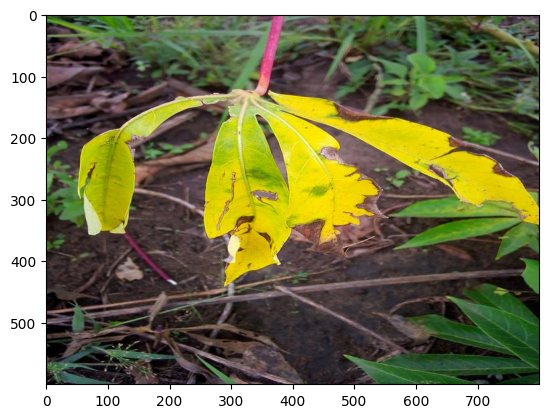

In [22]:
os.listdir('../input/cassava-leaf-disease-classification/test_images')
img=mpimg.imread('/kaggle/input/cassava-leaf-disease-classification/train_images/1001723730.jpg')
plt.imshow(img)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


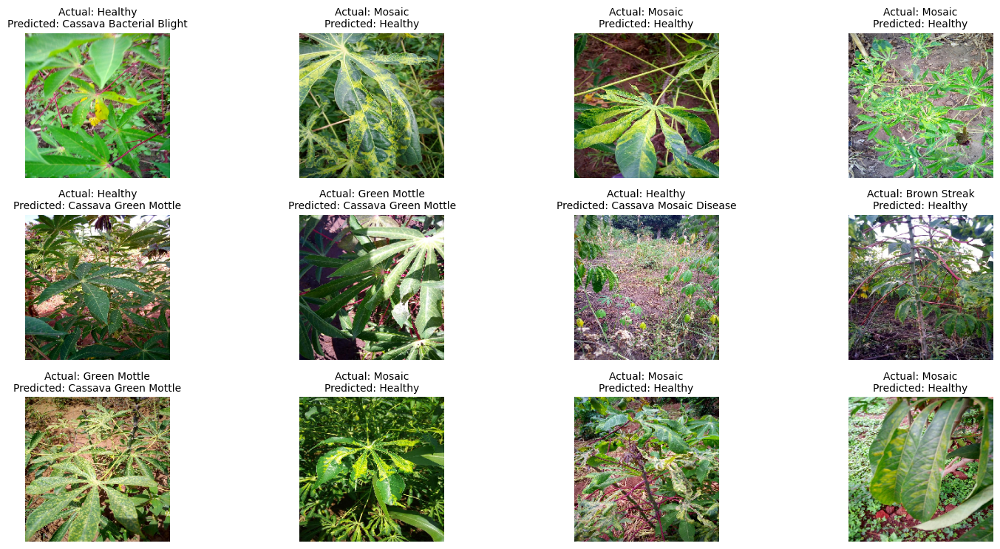

In [20]:
plot_actual_vs_predicted_grid()

In [33]:
def plot_actual_vs_predicted_grid(num_images=12, rows=4, cols=4):
    target_dir='/kaggle/input/cassava-leaf-disease-classification/train_images/'
    # Create a figure for the grid of images
    fig = plt.figure(figsize=(15, 10))
    
    for i in range(1, num_images + 1):
        # Selecting a random image from the directory
        random_image = random.choice(os.listdir(target_dir))
        img_path = os.path.join(target_dir, random_image)
        
        # Loading the image and preprocess it
        img = image.load_img(img_path, target_size=(224, 224))  
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0  # Normalize data for thr model
        
        # Predicting the class
        predictions = model.predict(img_array)
        predicted_class = np.argmax(predictions, axis=1)[0]
        
        # Map predicted class to disease name
        class_names = [
            "Bacterial Blight", 
            "Brown Streak Disease", 
            "Green Mottle", 
            "Healthy",
            "Mosaic Disease", 
            
        ]
        predicted_name = class_names[predicted_class]
        
        # Find the actual disease name using the image_id from the df database
        actual_row = df[df['image_id'] == random_image]
        actual_name = actual_row['full_name'].values[0]
        
        ax = fig.add_subplot(rows, cols, i)
        ax.imshow(img)
        ax.set_title(f'Actual: {actual_name}\nPredicted: {predicted_name}', fontsize=10)
        ax.axis('off')
    
    # Adjusting layout to prevent overlapping
    plt.tight_layout()
    plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


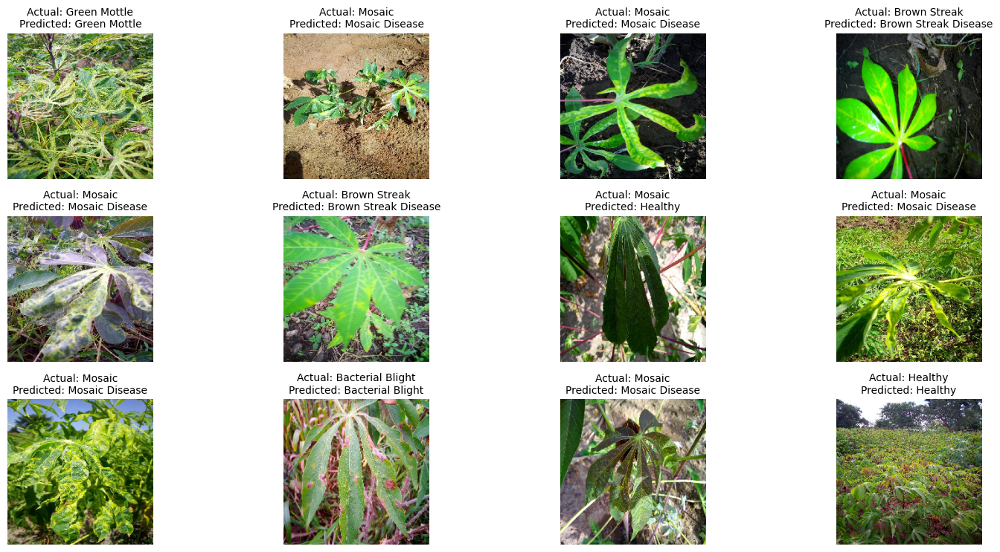

In [38]:
plot_actual_vs_predicted_grid()

submission